In [ ]:
from matplotlib import pyplot as plt
from tqdm import tqdm
import itertools
import os
import numpy as np
import scipy.sparse
import pandas as pd
import re
import tifffile
import xmltodict
import importlib.util
import sys
import scanpy as sc

sc.set_figure_params(dpi=80)

In [ ]:
import cuml
import cupy
import cudf
import cugraph
import cuspatial
import cupyx

In [ ]:
import math
from tifffile.tifffile import TiffFile
import xmltodict
from scipy.stats import linregress
import shutil
import scipy as sp

In [ ]:
%matplotlib inline
%config InlineBackend.figure_format='retina'


In [ ]:
import importlib.util
import sys

def lazy_import(module_name, path_to_file):
    spec = importlib.util.spec_from_file_location(module_name,path_to_file)
    foo = importlib.util.module_from_spec(spec)
    sys.modules[module_name] = foo
    spec.loader.exec_module(foo)
    return foo

utils_dir = "../../utils"
general_utils =  lazy_import("general_utils",os.path.join(utils_dir, "general_utils.py"))
preprocessing_utils = lazy_import("preprocessing_utils",os.path.join(utils_dir, "preprocessing_utils.py"))

from general_utils import ismember, grep, grep_exclude
from preprocessing_utils import kneepoint


In [ ]:
def plot_individual_category(adata, coord_name, obs_name, selected_values = []):
    X = adata.obsm[coord_name]
    if(len(selected_values) ==0):
        selected_values = np.unique(adata.obs[obs_name])
    for sample_id in selected_values:
        subcells = adata.obs[obs_name] == sample_id
        alt_id = np.unique(adata.obs[obs_name][subcells])
        f, ax = plt.subplots(1,1,figsize=[5,5], dpi=80)
        ax.scatter(X[:,0], X[:,1], color='lightgray', s=1, alpha = 0.05)
        ax.scatter(X[subcells,0], X[subcells,1], color='black', s=1, alpha = 0.05)
        ax.axis(False)
        ax.grid(False)
        ax.set_title(sample_id)
        plt.show(f)
        plt.close(f)


In [ ]:
def divide_csr_matrix_gpu(mat, size_factor):
    """Divide csr matrix using gpu row-wise

    Params:
        - mat: np.array
        - size_factor: np.array
    Returns:
        np.array normalized matrix
    """
    mat = cupyx.scipy.sparse.csr_matrix(mat.astype(np.float32))
    c = cupyx.scipy.sparse.diags(1 / size_factor)
    result = c @ mat
    return result.get()


def neighbors_gpu(mat, k=30):
    """Compute knn on a matrix using gpu

    Params:
        - mat: np.array
        - k: number of nearest neighbors
    Returns:
        tuple: distances and indices of knn (array format)
    """
    X_mat = cupy.array(mat)
    model = cuml.neighbors.NearestNeighbors(n_neighbors=k)
    model.fit(X_mat)
    distances, indices = model.kneighbors(X_mat)
    return (distances, indices)


def get_cugraph_from_csr_matrix(mat):
    """Get cugraph from csr_matrix

    Params:
        - mat: scipy.csr_matrix
    Returns:
        cugraph representation of matrix
    """
    sources, targets = mat.nonzero()
    edges = cudf.concat(
        [
            cudf.Series(sources.astype(np.int64), name="source"),  # sources
            cudf.Series(targets.astype(np.int64), name="destination"),  # targets
        ],
        axis=1,
    )
    G = cugraph.from_cudf_edgelist(edges)
    return G


def get_cugraph_from_array(mat):
    """Get cugraph from array

    Params:
        - mat: list of lists in np.array format, each row in the array corresponds to the source node, values correspond to indexes the connected nodes. It assumes that the row indexes are in the same space as the values in the array.

    Returns
    -------
        cugraph representation of matrix
    """
    targets = np.ravel(mat)
    n_neighbors_per_cell = [len(x) for x in mat]
    sources = np.ravel([[i] * k for i, k in zip(range(mat.shape[0]), n_neighbors_per_cell)])
    edges = cudf.concat(
        [
            cudf.Series(sources.astype(np.int64), name="source"),  # sources
            cudf.Series(targets.astype(np.int64), name="destination"),  # targets
        ],
        axis=1,
    )
    G = cugraph.from_cudf_edgelist(edges)
    return (G, edges)


def array_to_csr_matrix(mat):
    """Get csr_matrix from list of list graph representation

    Params:
        - mat: list of lists in np.array format, each row in the array corresponds to the source node, values correspond to indexes the connected nodes. It assumes that the row indexes are in the same space as the values in the array.

    Returns
    -------
        csr_matrix representation of graph
    """
    targets = np.ravel(mat)
    n_neighbors_per_cell = [len(x) for x in mat]
    sources = np.ravel([[i] * k for i, k in zip(range(mat.shape[0]), n_neighbors_per_cell, strict=False)])
    result = scipy.sparse.csr_matrix(([1] * len(sources), (sources, targets)), shape=[mat.shape[0]] * 2)
    return result

def phenograph_gpu(
    G,
    min_size=-1,
    resolution=1.0,
):
    print("   Building Jaccard matrix")
    # Build jaccard-weighted graph in GPU
    jaccard_edges = cugraph.jaccard(G, edges[['source', 'destination']])
    G = cugraph.from_cudf_edgelist(jaccard_edges, *jaccard_edges.columns)
    
    print("   Finding clusters using louvain")
    # Cluster jaccard-weighted graph
    result, score = cugraph.louvain(G, resolution = resolution)
    
    # Sort clusters by size
    sizes = result['partition'].value_counts()
    sizes.loc[:] = cupy.where(sizes > min_size, cupy.arange(len(sizes)), -1)
    result['partition'] = result['partition'].map(sizes)
    
    # Sort by vertex (e.g. cell)
    clusters = result.sort_values('vertex')['partition'].values.get()
    return clusters

def get_jaccard(
    G,
):
    print("   Building Jaccard matrix")
    # Build jaccard-weighted graph in GPU
    jaccard_edges = cugraph.jaccard(G, edges[['source', 'destination']])
    G = cugraph.from_cudf_edgelist(jaccard_edges, *jaccard_edges.columns)
    return(G)

def louvain_gpu(G, min_size = 1, resolution=1.0):
    print("   Finding clusters using louvain")
    # Cluster jaccard-weighted graph
    result, score = cugraph.louvain(G, resolution = resolution)
    
    # Sort clusters by size
    sizes = result['partition'].value_counts()
    sizes.loc[:] = cupy.where(sizes > min_size, cupy.arange(len(sizes)), -1)
    result['partition'] = result['partition'].map(sizes)
    
    # Sort by vertex (e.g. cell)
    clusters = result.sort_values('vertex')['partition'].values.get()
    return clusters    

def leiden_gpu(G, resolution=1.0):
    print("   Getting Leiden clusters")
    result, score = cugraph.leiden(G, max_iter = 100, resolution = resolution, random_state = 777)
    # Sort by vertex (e.g. cell)
    clusters = result.sort_values('vertex')['partition'].values.get()
    return(clusters)

def normalize_pca(
    adata,
    log = True,
    excluded_genes = [],
    min_count_threshold_default = 25,
    min_count_criteria = 'fixed'
):
    if len(excluded_genes) > 0:
        adata.var['excluded'] = excluded_genes
    else:
        adata.var['excluded'] = [False] * adata.n_vars
    # Exclude cells that have less than 2 counts for non-excluded genes
    adata = adata[adata.layers['raw'][:,np.logical_not(adata.var['excluded'])].sum(axis=1) > 1,:].copy()
    
    adata.X = adata.layers['raw'].copy()
    size_factor = np.ravel(adata.X[:,np.logical_not(adata.var['excluded'])].sum(axis=1))
    adata.obs['size_factor'] = size_factor.copy()
    
    # QC metrics
    sc.pp.calculate_qc_metrics(
        adata,
        inplace=True,
        log1p=False,
        layer="raw"
    )
    obs_cols = ["total_counts", "n_genes_by_counts"]
    var_cols = ["total_counts", "n_cells_by_counts", "mean_counts"]
    adata.obs[
        [f"log10_{c}" for c in obs_cols]
    ] = np.log10(adata.obs[obs_cols]+1) # pseudocount 1
    adata.var[
        [f"log10_{c}" for c in var_cols]
    ] = np.log10(adata.var[var_cols]+1) # pseudocount 1

    original_n = adata.n_obs
    # Filter low library-size cells
    x = np.arange(adata.shape[0])
    counts_by_cell = adata.X[:,np.logical_not(adata.var['excluded'])].sum(1).A.T[0]
    if(min_count_criteria == 'fixed'):
        min_count_threshold = min_count_threshold_default
    else:
        y = np.sort(counts_by_cell)[::-1]
        idx = kneepoint(np.log10(y), x)
        min_count_threshold = max(25, y[idx])
    adata = adata[counts_by_cell >= min_count_threshold,:].copy()
    final_n = adata.n_obs
    print("   Excluded %d cells with less than %d counts" % (original_n - final_n, min_count_threshold))

    # Median library-size normalization
    print("   Normalizing data")
    size_factor = adata.obs['size_factor'].to_numpy()
    adata.X = divide_csr_matrix_gpu(adata.X, size_factor) * np.median(size_factor)
    adata.X = adata.X.astype(np.float32)
    
    # Log transform if indicated for embedding computation
    if(log):
        print("   Log transform with pseudocount 1")
        # Log-transformation (natural log, pseudocount of 1)
        sc.pp.log1p(adata)

    # Run PCA using GPU
    print("   Running PCA")
    counts_sparse_gpu = cupyx.scipy.sparse.csr_matrix(adata.X[:,np.logical_not(adata.var['excluded'])])
    model = cuml.PCA(n_components=adata.shape[1]-1)
    model.fit(X=counts_sparse_gpu)
    X_pca = model.transform(counts_sparse_gpu)
    
    adata.obsm['X_pca_max'] = X_pca.get().astype(np.float32)
    adata.uns['pca_explained_var'] = model.explained_variance_ratio_.get()
    
    # Log transform for downstream computation
    if(not log):
        # Log-transformation (natural log, pseudocount of 1)
        sc.pp.log1p(adata)
    
    return(adata)

def umap(
    X,
    n_neighbors = 30,
    min_dist = 0.05
):
    model = cuml.UMAP(
        min_dist=min_dist,
        spread=1,
        learning_rate=0.1,
        n_epochs=20000,
        n_neighbors = n_neighbors,
        verbose=True
    )
    X = cupy.array(X)
    model.fit(X=X)
    X_umap = model.transform(X)    
    return(X_umap.get())

def quick_embed(adata_sub):
    frac_expressed = np.ravel((adata_sub.X > 0).sum(axis=0)) / adata_sub.n_obs
    adata_sub.var['excluded'] = np.logical_or(adata_sub.var['excluded'], frac_expressed <= 0.01)
    adata_sub = normalize_pca(adata_sub)
    total_var = 0.75
    n_pcs = np.argmin(abs(adata_sub.uns['pca_explained_var'].cumsum() - total_var))
    adata_sub.obsm['X_pca'] = adata_sub.obsm['X_pca_max'][:,:n_pcs].copy()
    distances, indices = neighbors_gpu(adata_sub.obsm['X_pca'])
    adata_sub.obsm['indices'] = indices.copy()
    G, edges = get_cugraph_from_array(indices)
    adata_sub.obs['Leiden_cluster'] = pd.Categorical(leiden_gpu(G))
    #adata_sub.obs['PhenoGraph_cluster'] = pd.Categorical(phenograph_gpu(G))
    #adata_sub.obsm['X_umap'] = umap(adata_sub.obsm['X_pca'])
    return(adata_sub)

def marker_genes_for_cell_group(adata, query_cells, reference_cells = None):
    if reference_cells is None:
        reference_cells = np.array([True] * adata.n_obs)
    adata.obs['group_temp'] = query_cells
    valid_cells = np.logical_or(query_cells, reference_cells)
    adata_sub = adata[valid_cells,:].copy()
    adata_sub.obs['group_temp'] = ['query' if x else 'reference' for x in adata_sub.obs['group_temp']]
    sc.tl.rank_genes_groups(adata_sub, groupby='group_temp')
    sc.tl.dendrogram(adata_sub, groupby='group_temp')
    sc.pl.rank_genes_groups_dotplot(adata_sub, groupby='group_temp', n_genes=50)

In [ ]:
tenx_data_dir = "../xenium_rawdata/"
output_path = '../xenium_preprocessing_outputs'

knn_output_path = os.path.join(output_path, 'knn')
pca_output_path = os.path.join(output_path, 'pca')
umap_output_path = os.path.join(output_path, 'umap')
adata_base_output_path = os.path.join(output_path, 'adata_base')
obs_output_path = os.path.join(output_path, 'obs')
updated_obs_output_path = os.path.join(output_path, 'obs_updated')
compiled_output_path = os.path.join(output_path, 'compiled')

os.makedirs(compiled_output_path, exist_ok=True)


In [ ]:
def get_compiled_adata_subset(selected_tier, selected_subset, use_log, explained_var, umap_n_neighbors, cluster_n_neighbors, selected_layer = 'raw_in_nucleus', umap_min_dist = 0.05):
    dataset_prefix = "adata_" + selected_tier + "_SUBSET_%s_LAYER_%s_LOG_%s" % (selected_subset, selected_layer, use_log)
    file_prefix = "%s_EXPLAINEDVAR_%d_KNN_%s" % (dataset_prefix, int(explained_var * 100), "%d")
    
    adata_base_file = os.path.join(adata_base_output_path, dataset_prefix + ".h5ad")
    obs_file = os.path.join(obs_output_path,file_prefix % (cluster_n_neighbors) + "__obs.h5ad" )
    umap_file = os.path.join(umap_output_path,file_prefix % (umap_n_neighbors) + "_MINDIST_%d__umap.csv.gz" % int(umap_min_dist * 100))
    knn_file = os.path.join(knn_output_path,file_prefix % (cluster_n_neighbors) + "__knn.h5ad" )
    output_template = dataset_prefix + "_EXPLAINEDVAR_%d_CLUSTERKNN_%d_UMAPKNN_%d_MINDIST_%d__compiled.h5ad"
    output_file = os.path.join(compiled_output_path, output_template % (int(explained_var * 100), cluster_n_neighbors, umap_n_neighbors, int(umap_min_dist * 100)))

    print("Reading counts file")
    adata = sc.read_h5ad(adata_base_file)
    print("Reading obs file")
    obs = sc.read_h5ad(obs_file)
    print("Reading umap file")
    umap = pd.read_csv(umap_file, index_col = 0)
    print("Reading knn file")
    knn = sc.read_h5ad(knn_file)
    adata.obsm['indices'] = knn.obsm['indices'].copy()
    
    adata.obsm['X_umap'] = umap.to_numpy()
    for colname in obs.obs.columns:
        adata.obs[colname] = pd.Categorical(obs.obs[colname])

    print("Loading master annotations")
    master_obs = sc.read_h5ad(os.path.join(updated_obs_output_path, "adata_tier0_SUBSET_all_LAYER_raw_in_nucleus_LOG_False_EXPLAINEDVAR_75_KNN_30__obs.h5ad"))
    master_obs = master_obs[adata.obs_names,:].copy()
    for my_obs in ['cell_type_0', 'cell_type_1']:
        adata.obs[my_obs] = master_obs.obs[my_obs].copy()
    
    return(adata, output_file)

In [ ]:
selected_tier = 'tier0'
selected_subset = 'Epi'
use_log = False
explained_var = 0.75
umap_n_neighbors = 10
cluster_n_neighbors = 30
selected_layer = 'raw_in_nucleus'
umap_min_dist = 0.1
adata, compiled_output_path = get_compiled_adata_subset(selected_tier = selected_tier, selected_subset = selected_subset, use_log = use_log, explained_var = explained_var, umap_n_neighbors = umap_n_neighbors, cluster_n_neighbors = cluster_n_neighbors, selected_layer = selected_layer, umap_min_dist = umap_min_dist)


Reading counts file
Reading obs file
Reading umap file
Reading knn file
Loading master annotations


I read the master annotations file (all cells) to bring in updated annotations that didn't make it into the subset objects. I only bring in the updated annotations the first time I use this data

In [ ]:
updated_annotations_file = "adata_" + 'tier0' + "_SUBSET_all_LAYER_%s_LOG_%s_EXPLAINEDVAR_%d_KNN_%s__obs.h5ad" % (selected_layer, use_log, int(explained_var * 100), cluster_n_neighbors)
stable_master_obs_file = os.path.join(obs_output_path,updated_annotations_file)
updated_master_obs_file = os.path.join(updated_obs_output_path,updated_annotations_file)
if not os.path.exists(updated_master_obs_file):
    print("Reading stable master annotation file")
    obs_master = sc.read_h5ad(stable_master_obs_file)
    sc.write(updated_master_obs_file, obs_master)
else:
    obs_master = sc.read_h5ad(updated_master_obs_file)

/data/lowe/reyesj3/miniconda3/envs/rapidsai/lib/python3.9/site-packages/scanpy/plotting/_utils.py:432: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + '_colors'] = colors_list
/data/lowe/reyesj3/miniconda3/envs/rapidsai/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


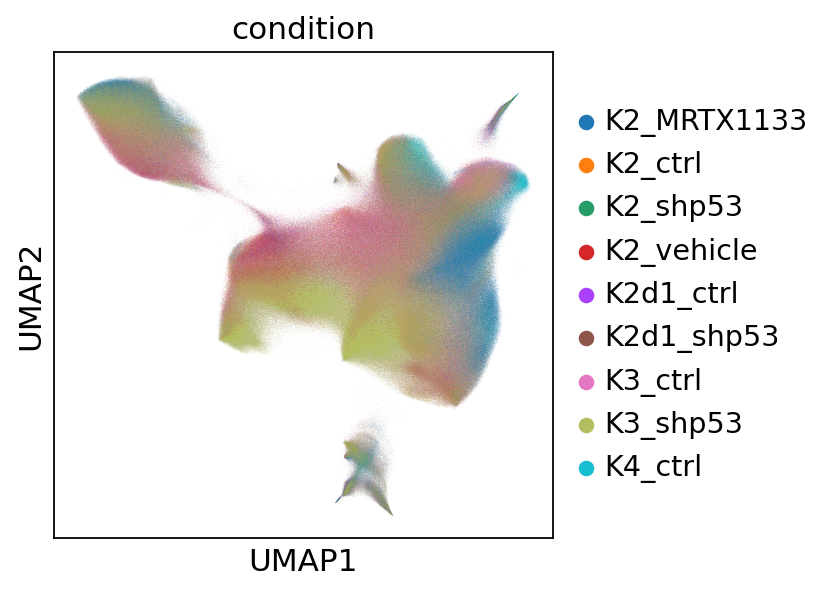

In [ ]:
sc.pl.umap(adata[adata.obs['cell_type_0'] == 'Epithelial',:], color='condition')

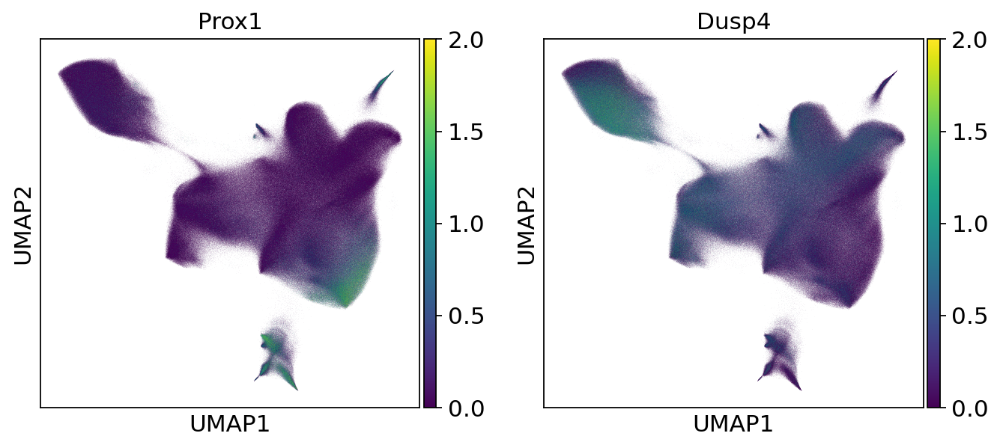

In [ ]:
sc.pl.umap(adata[adata.obs['cell_type_0'] == 'Epithelial',:], color=['Prox1', 'Dusp4'], vmax=2)

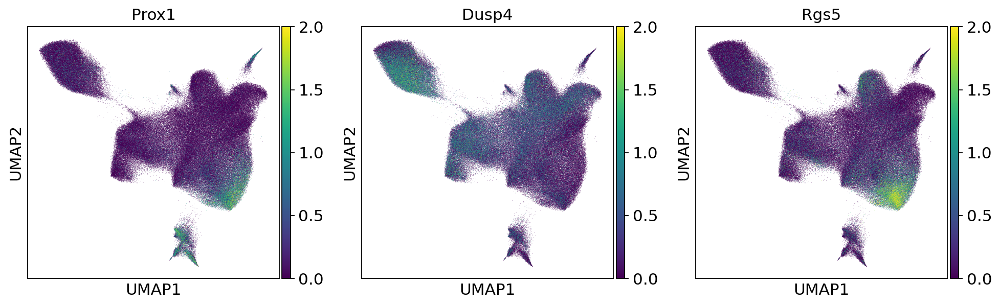

In [ ]:
import random
cell_indexes = list(range(adata.n_obs))
random_indexes = random.sample(cell_indexes, int(adata.n_obs/10))
adata_sub = adata[random_indexes,:].copy()
sc.pl.umap(adata_sub[adata_sub.obs['cell_type_0'] == 'Epithelial',:], color=['Prox1', 'Dusp4', 'Rgs5'], vmax=2)

Compute PhenoGraph clusters for more precise cell typing

In [ ]:
G, edges = get_cugraph_from_array(adata.obsm['indices'])
jaccard_G = get_jaccard(G)

/data/lowe/reyesj3/miniconda3/envs/rapidsai/lib/python3.9/site-packages/cugraph/structure/symmetrize.py:93: FutureWarning: Multi is deprecated and the removal of multi edges will no longer be supported from 'symmetrize'. Multi edges will be removed upon creation of graph instance.
  warnings.warn(


   Building Jaccard matrix


/data/lowe/reyesj3/miniconda3/envs/rapidsai/lib/python3.9/site-packages/cugraph/structure/symmetrize.py:93: FutureWarning: Multi is deprecated and the removal of multi edges will no longer be supported from 'symmetrize'. Multi edges will be removed upon creation of graph instance.
  warnings.warn(


In [ ]:
clusters = louvain_gpu(jaccard_G, resolution = 1)
adata.obs['PhenoGraph_cluster_higres'] = pd.Categorical(clusters)

   Finding clusters using louvain


In [ ]:
clusters = louvain_gpu(jaccard_G, resolution = 0.75)
adata.obs['PhenoGraph_cluster_medres'] = pd.Categorical(clusters)

   Finding clusters using louvain


In [ ]:
clusters = louvain_gpu(jaccard_G, resolution = 0.5)
adata.obs['PhenoGraph_cluster_lowres'] = pd.Categorical(clusters)

   Finding clusters using louvain


In [ ]:
adata_sub = adata[random_indexes,:].copy()

/data/lowe/reyesj3/miniconda3/envs/rapidsai/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


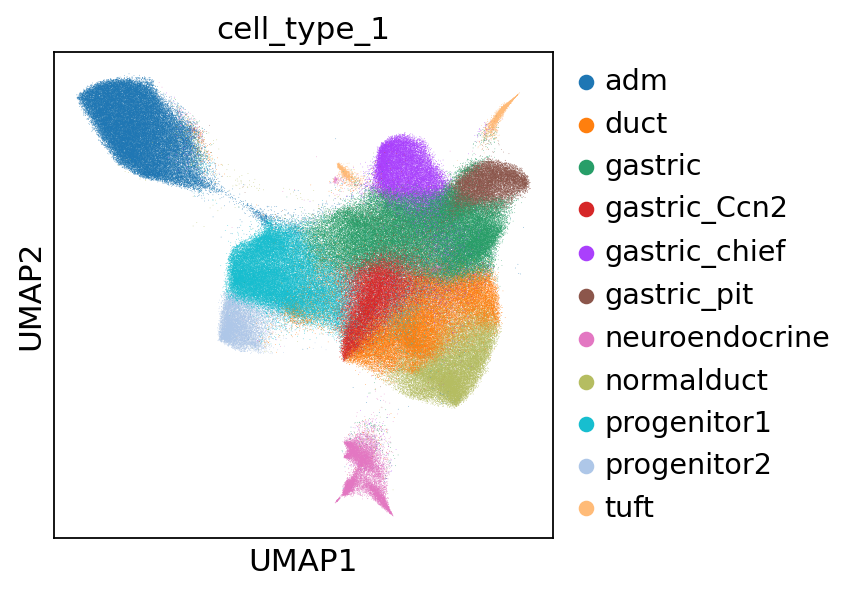

In [ ]:
sc.pl.umap(adata_sub, color='cell_type_1')

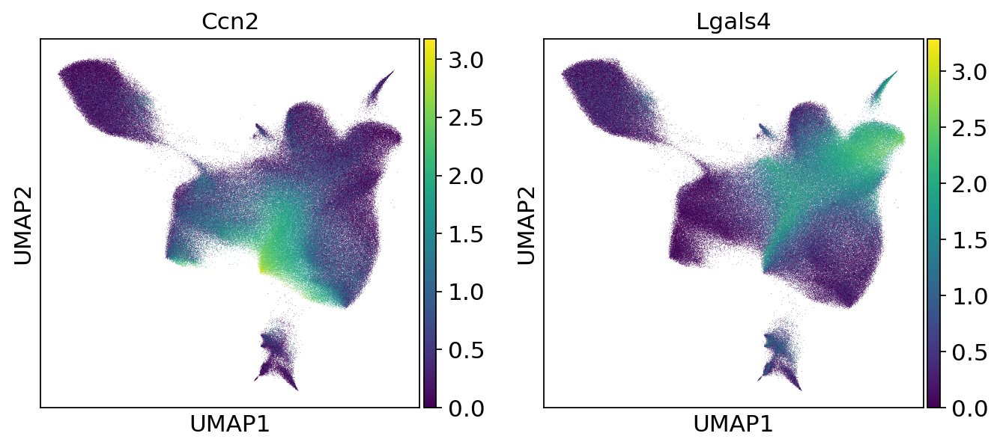

In [ ]:
sc.pl.umap(adata_sub, color=['Ccn2', 'Lgals4'])

Annotate refined cell types using cluster information

/data/lowe/reyesj3/miniconda3/envs/rapidsai/lib/python3.9/site-packages/scanpy/plotting/_dotplot.py:747: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


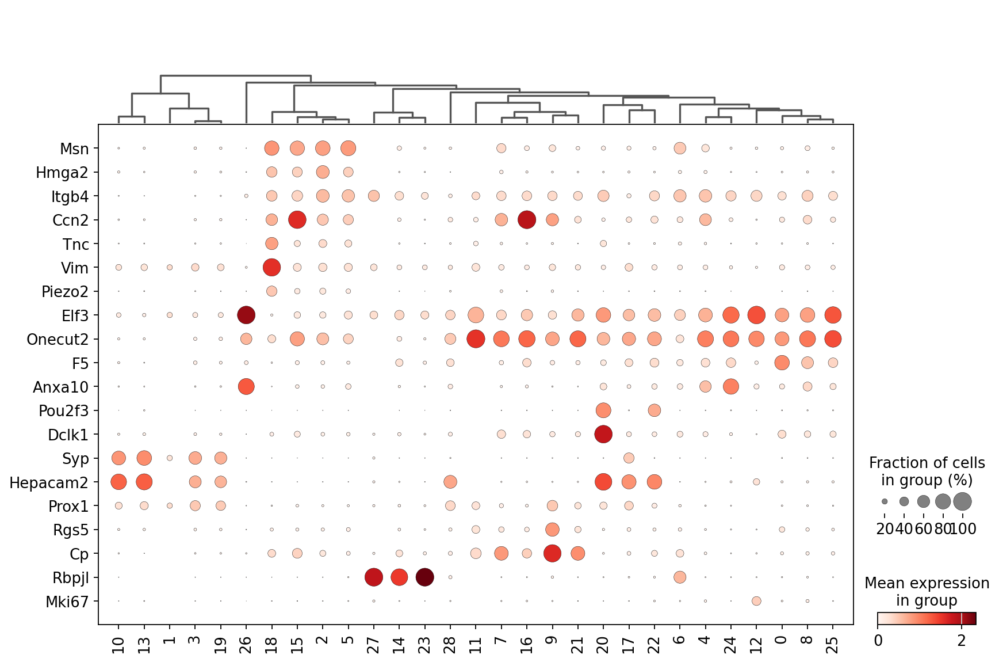

In [ ]:
progenitor1 = ['Msn', 'Hmga2', 'Itgb4', 'Ccn2']
progenitor2 = ['Tnc', 'Vim', 'Piezo2']
gastric = ['Elf3', 'Onecut2']
gastric_chief = ['F5']
gastric_pit = ['Anxa10']
tuft = ['Pou2f3', 'Dclk1']
neuroendocrine = ['Syp', 'Hepacam2']
normal_duct = ['Cp']
duct = ['Prox1', 'Rgs5']
adm = ['Rbpjl']
cycling = ['Mki67']

selected_genes = progenitor1 + progenitor2 + gastric + gastric_chief + gastric_pit + tuft + neuroendocrine + duct + normal_duct + adm + cycling
sc.tl.dendrogram(adata_sub, groupby = 'Leiden_cluster', var_names = selected_genes)
sc.pl.dotplot(adata_sub, groupby='Leiden_cluster', var_names = selected_genes, swap_axes=True, dendrogram=True)

In [ ]:
cell_type_1 = adata.obs['cell_type_0'].to_numpy().copy()
cell_type_1[ismember(adata.obs['Leiden_cluster'], [])[1]] = 'progenitor0'
cell_type_1[ismember(adata.obs['Leiden_cluster'], [15,2,5])[1]] = 'progenitor1'
cell_type_1[ismember(adata.obs['Leiden_cluster'], [18])[1]] = 'progenitor2'
cell_type_1[ismember(adata.obs['Leiden_cluster'], [0])[1]] = 'gastric_chief'
cell_type_1[ismember(adata.obs['Leiden_cluster'], [26,24])[1]] = 'gastric_pit'
cell_type_1[ismember(adata.obs['Leiden_cluster'], [11,12,8,25,4])[1]] = 'gastric'
cell_type_1[ismember(adata.obs['Leiden_cluster'], [22,20])[1]] = 'tuft'
cell_type_1[ismember(adata.obs['Leiden_cluster'], [1,3,19,10,13,28,17])[1]] = 'neuroendocrine'
cell_type_1[ismember(adata.obs['Leiden_cluster'], [27,14,23,6])[1]] = 'adm'
cell_type_1[ismember(adata.obs['Leiden_cluster'], [7,16,21])[1]] = 'duct'
cell_type_1[ismember(adata.obs['Leiden_cluster'], [9])[1]] = 'normalduct'
adata.obs['cell_type_1'] = cell_type_1.copy()

/data/lowe/reyesj3/miniconda3/envs/rapidsai/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


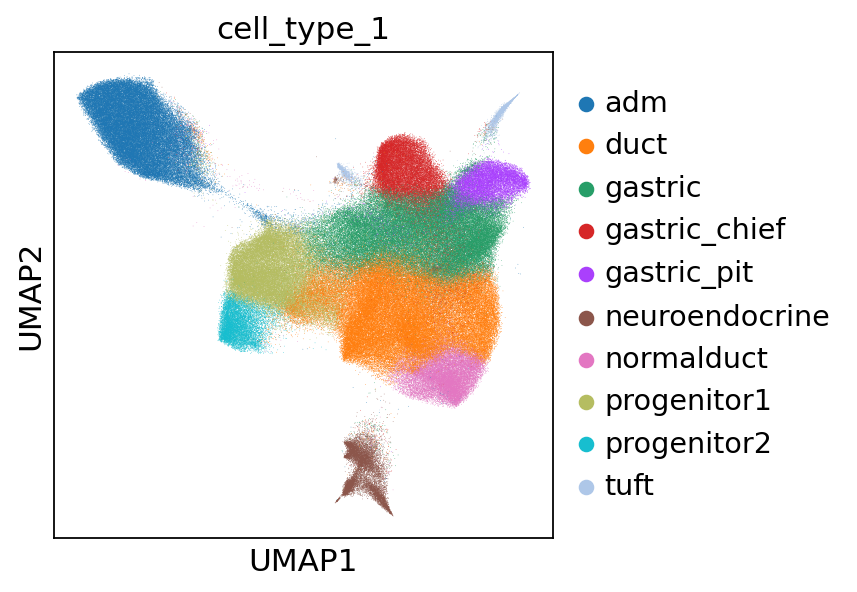

In [ ]:
adata_sub = adata[random_indexes,:].copy()
sc.pl.umap(adata_sub, color='cell_type_1')

/data/lowe/reyesj3/miniconda3/envs/rapidsai/lib/python3.9/site-packages/scanpy/plotting/_dotplot.py:747: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


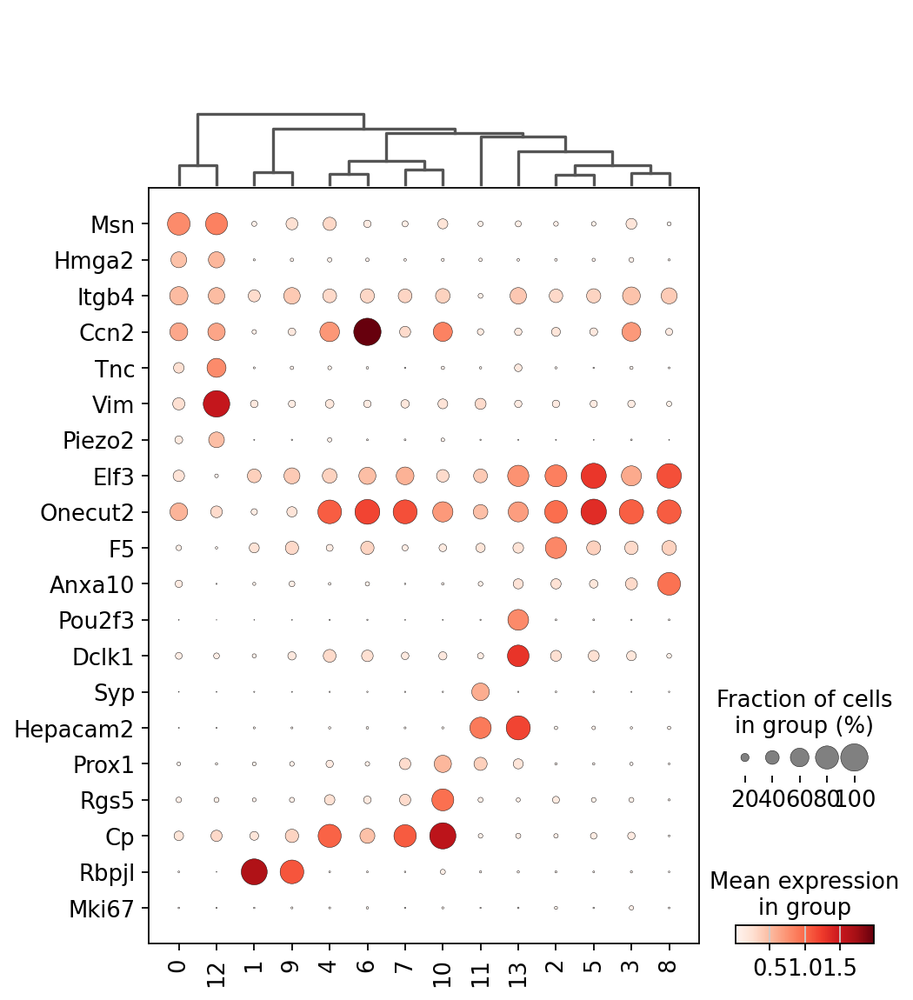

In [ ]:
progenitor1 = ['Msn', 'Hmga2', 'Itgb4', 'Ccn2']
progenitor2 = ['Tnc', 'Vim', 'Piezo2']
gastric = ['Elf3', 'Onecut2']
gastric_chief = ['F5']
gastric_pit = ['Anxa10']
tuft = ['Pou2f3', 'Dclk1']
neuroendocrine = ['Syp', 'Hepacam2']
normal_duct = ['Cp']
duct = ['Prox1', 'Rgs5']
adm = ['Rbpjl']
cycling = ['Mki67']

selected_genes = progenitor1 + progenitor2 + gastric + gastric_chief + gastric_pit + tuft + neuroendocrine + duct + normal_duct + adm + cycling
sc.tl.dendrogram(adata_sub, groupby = 'PhenoGraph_cluster_medres', var_names = selected_genes)
sc.pl.dotplot(adata_sub, groupby='PhenoGraph_cluster_medres', var_names = selected_genes, swap_axes=True, dendrogram=True)

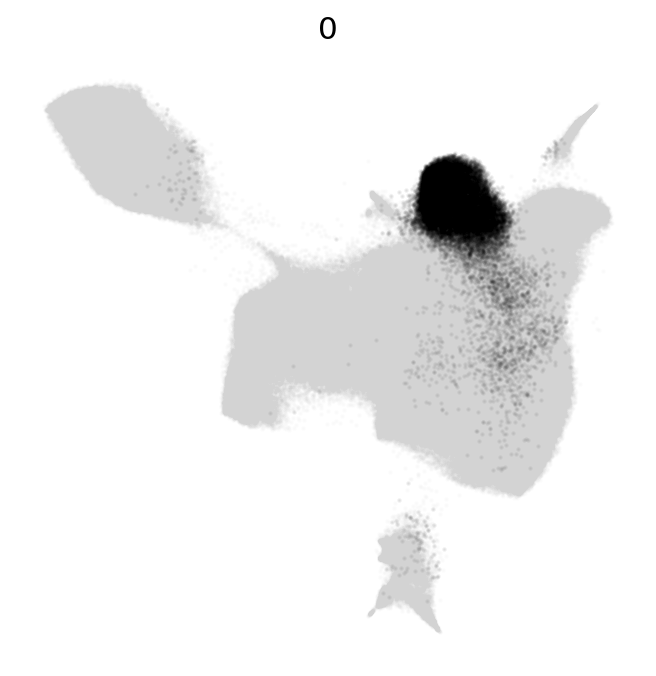

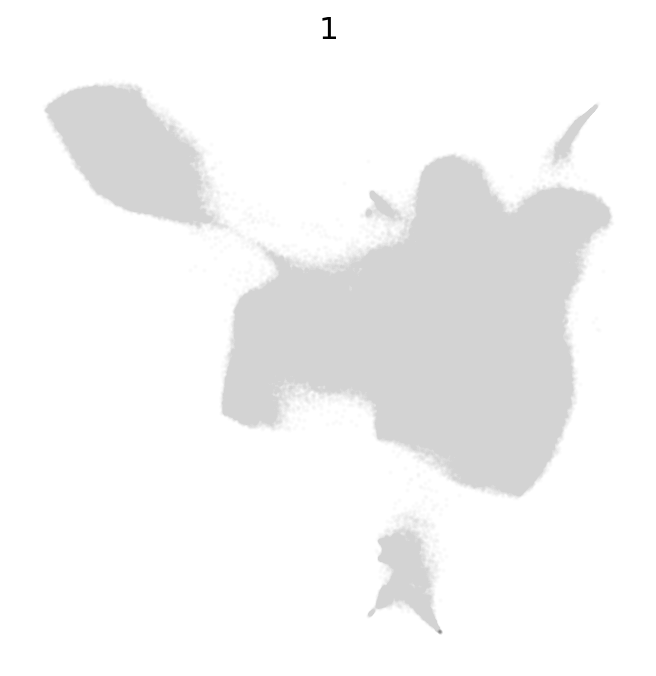

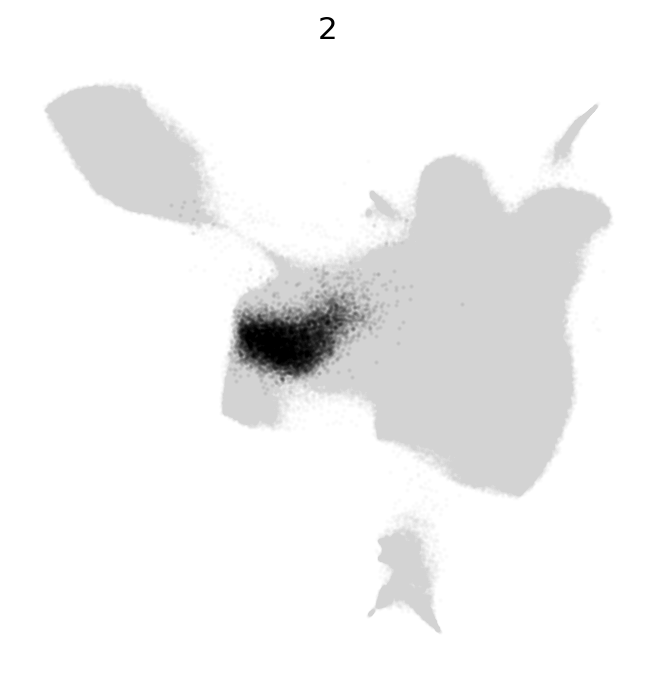

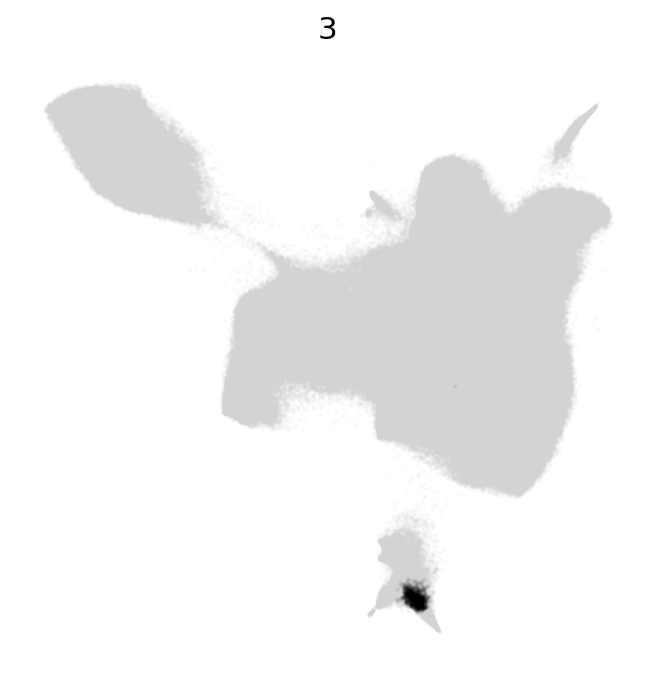

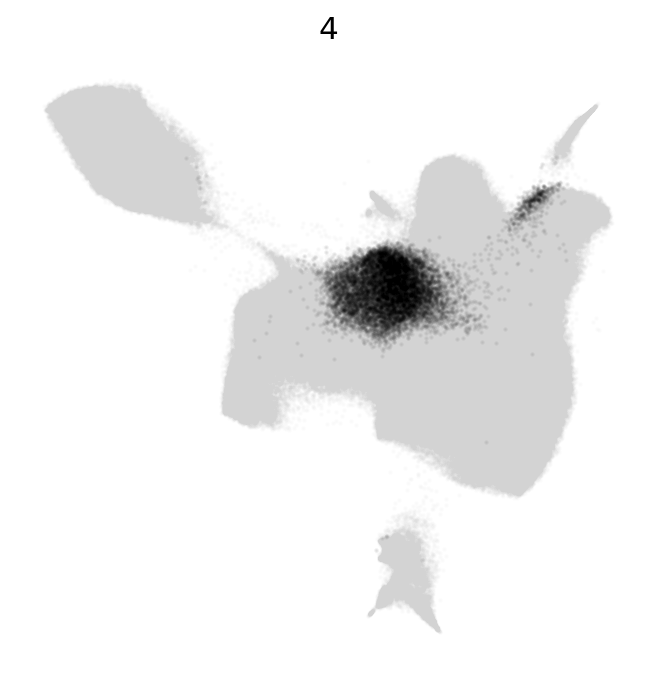

...

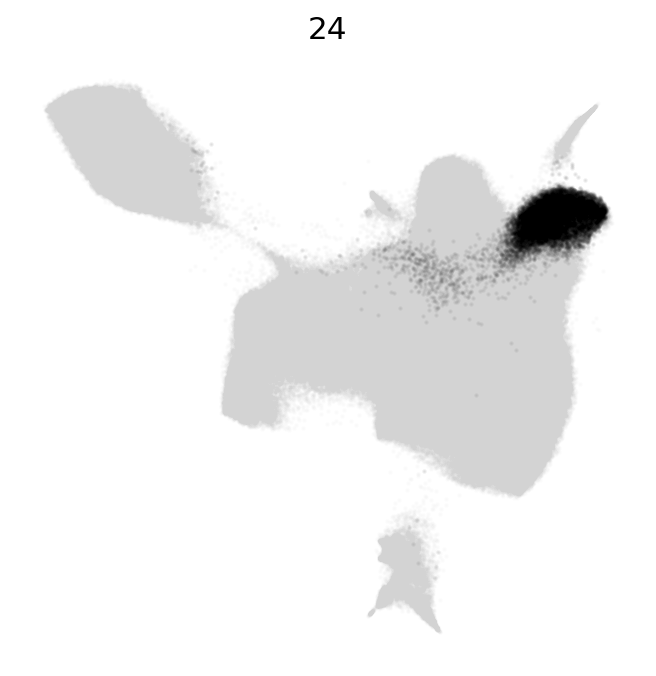

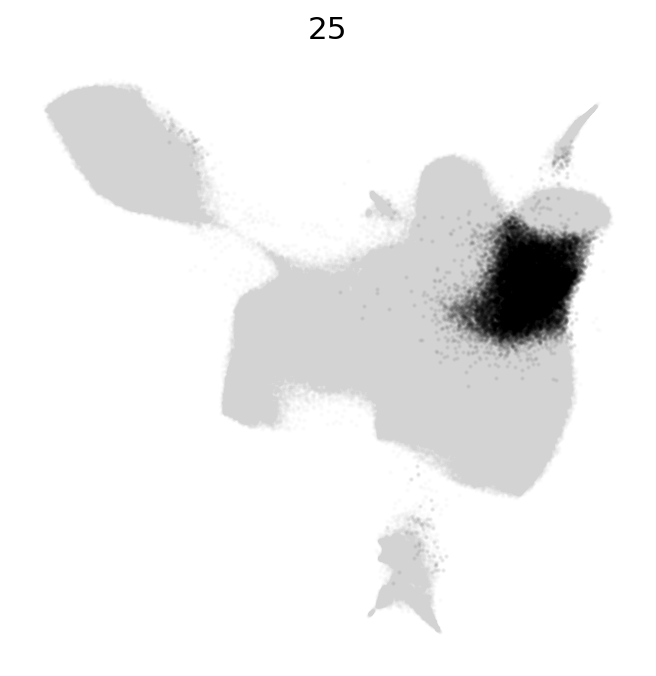

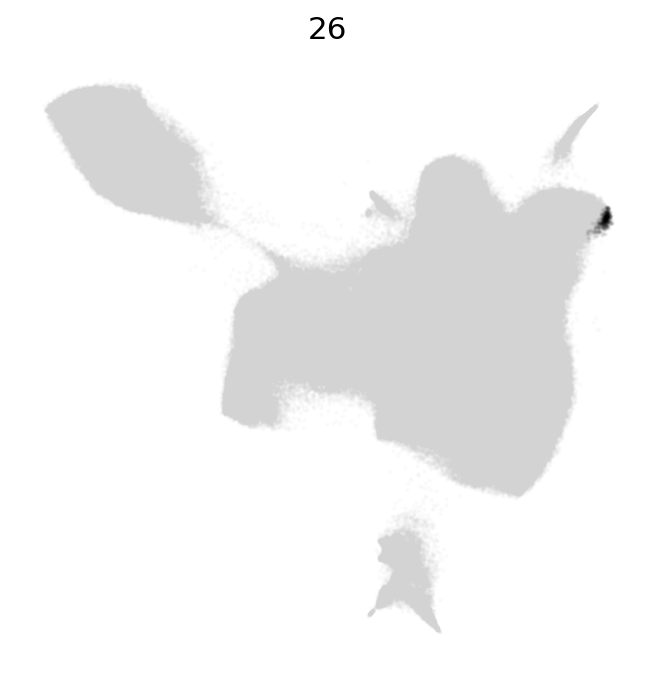

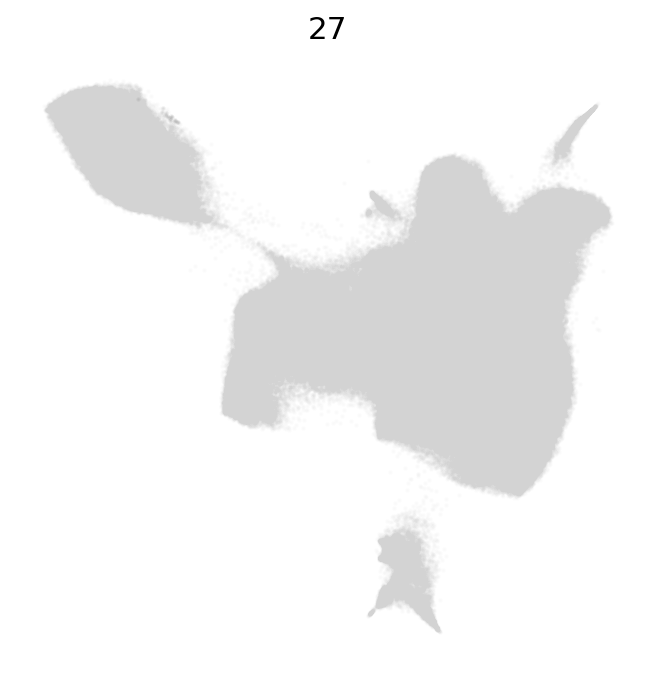

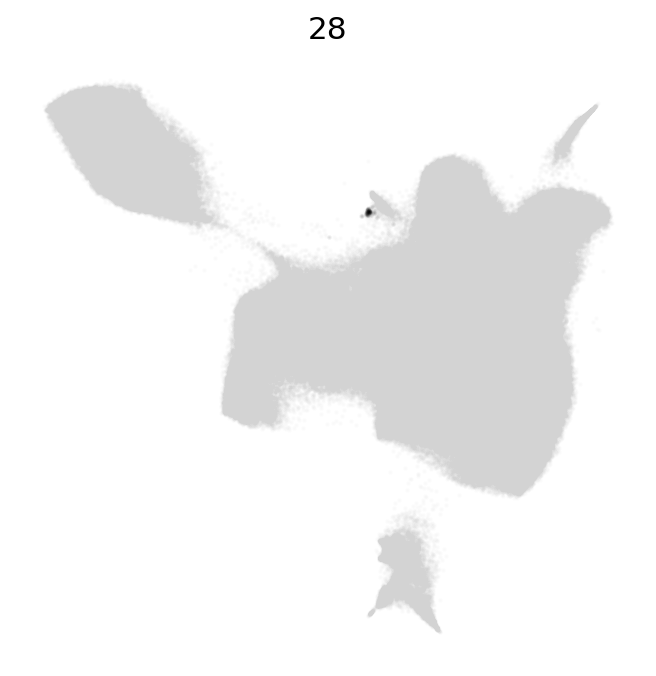

In [ ]:
plot_individual_category(adata_sub, "X_umap", "Leiden_cluster")

### Re-embed duct-like cells to distinguish between normal and transformed duct-like cells

In [ ]:
def quick_embed(adata_sub):
    frac_expressed = np.ravel((adata_sub.X > 0).sum(axis=0)) / adata_sub.n_obs
    adata_sub.var['excluded'] = np.logical_or(adata_sub.var['excluded'], frac_expressed <= 0.01)
    adata_sub = normalize_pca(adata_sub)
    total_var = 0.75
    n_pcs = np.argmin(abs(adata_sub.uns['pca_explained_var'].cumsum() - total_var))
    adata_sub.obsm['X_pca'] = adata_sub.obsm['X_pca_max'][:,:n_pcs].copy()
    distances, indices = neighbors_gpu(adata_sub.obsm['X_pca'])
    adata_sub.obsm['indices'] = indices.copy()
    G, edges = get_cugraph_from_array(indices)
    adata_sub.obs['Leiden_cluster'] = pd.Categorical(leiden_gpu(G))
    #adata_sub.obs['PhenoGraph_cluster'] = pd.Categorical(phenograph_gpu(G))
    #adata_sub.obsm['X_umap'] = umap(adata_sub.obsm['X_pca'])
    return(adata_sub)

In [ ]:
adata_duct = adata[ismember(adata.obs['cell_type_1'], ['duct', 'normalduct'])[1],:].copy()

In [ ]:
adata_duct = quick_embed(adata_duct)

   Excluded 0 cells with less than 25 counts
   Normalizing data
   Log transform with pseudocount 1
   Running PCA


/data/lowe/reyesj3/miniconda3/envs/rapidsai/lib/python3.9/site-packages/cugraph/structure/symmetrize.py:93: FutureWarning: Multi is deprecated and the removal of multi edges will no longer be supported from 'symmetrize'. Multi edges will be removed upon creation of graph instance.
  warnings.warn(


   Getting Leiden clusters


In [ ]:
G, edges = get_cugraph_from_array(adata_duct.obsm['indices'])
jaccard_G = get_jaccard(G)

/data/lowe/reyesj3/miniconda3/envs/rapidsai/lib/python3.9/site-packages/cugraph/structure/symmetrize.py:93: FutureWarning: Multi is deprecated and the removal of multi edges will no longer be supported from 'symmetrize'. Multi edges will be removed upon creation of graph instance.
  warnings.warn(


   Building Jaccard matrix


/data/lowe/reyesj3/miniconda3/envs/rapidsai/lib/python3.9/site-packages/cugraph/structure/symmetrize.py:93: FutureWarning: Multi is deprecated and the removal of multi edges will no longer be supported from 'symmetrize'. Multi edges will be removed upon creation of graph instance.
  warnings.warn(


In [ ]:
clusters = louvain_gpu(jaccard_G, resolution = 1)
adata_duct.obs['PhenoGraph_cluster_higres'] = pd.Categorical(clusters)

   Finding clusters using louvain


In [ ]:
clusters = louvain_gpu(jaccard_G, resolution = 0.75)
adata_duct.obs['PhenoGraph_cluster_medres'] = pd.Categorical(clusters)

   Finding clusters using louvain


In [ ]:
clusters = louvain_gpu(jaccard_G, resolution = 0.5)
adata_duct.obs['PhenoGraph_cluster_lowres'] = pd.Categorical(clusters)

   Finding clusters using louvain


/data/lowe/reyesj3/miniconda3/envs/rapidsai/lib/python3.9/site-packages/scanpy/plotting/_dotplot.py:747: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


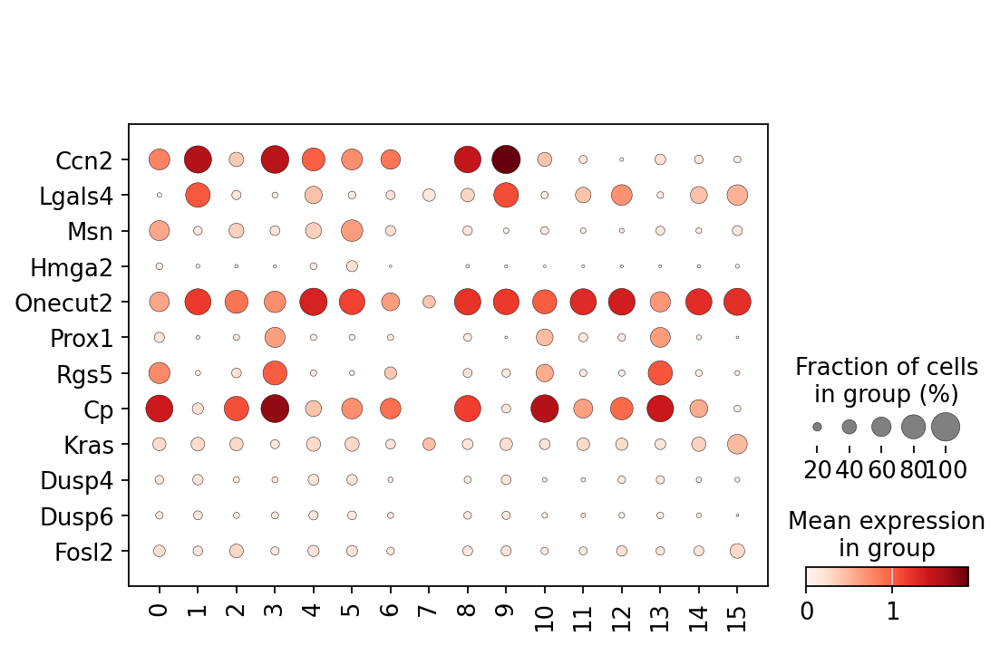

In [ ]:
sc.pl.dotplot(adata_duct, groupby = 'Leiden_cluster', var_names = ['Ccn2', 'Lgals4', 'Msn', 'Hmga2', 'Onecut2', 'Prox1', 'Rgs5', 'Cp', 'Kras', 'Dusp4', 'Dusp6', 'Fosl2'], swap_axes=True)

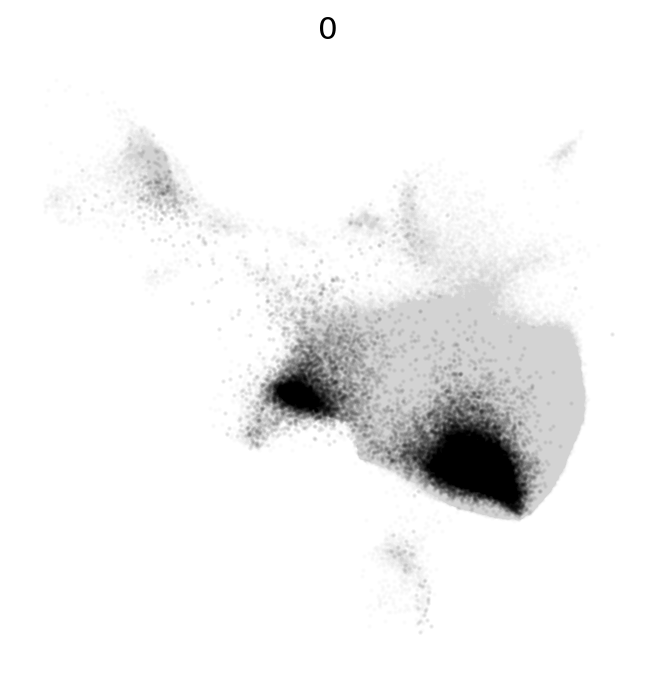

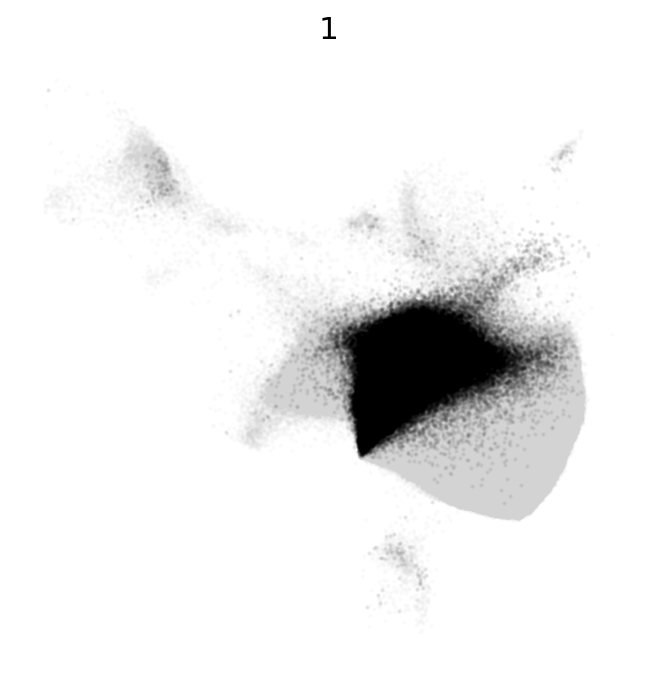

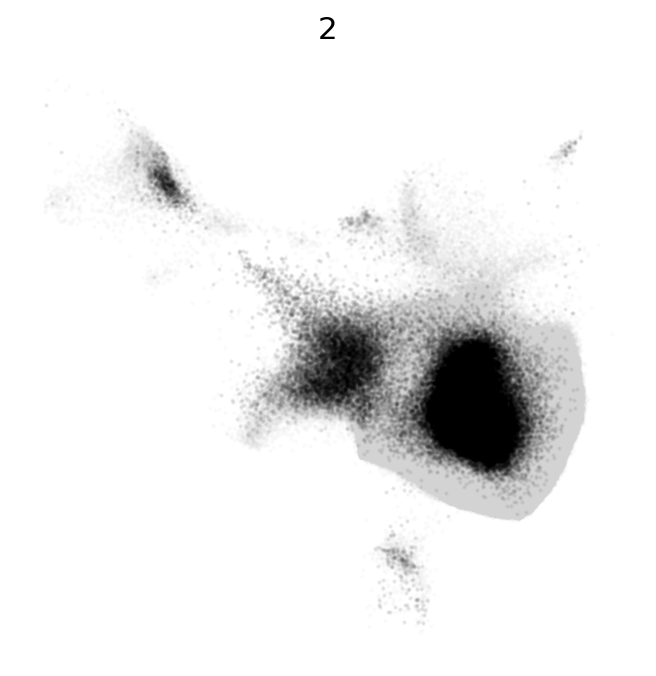

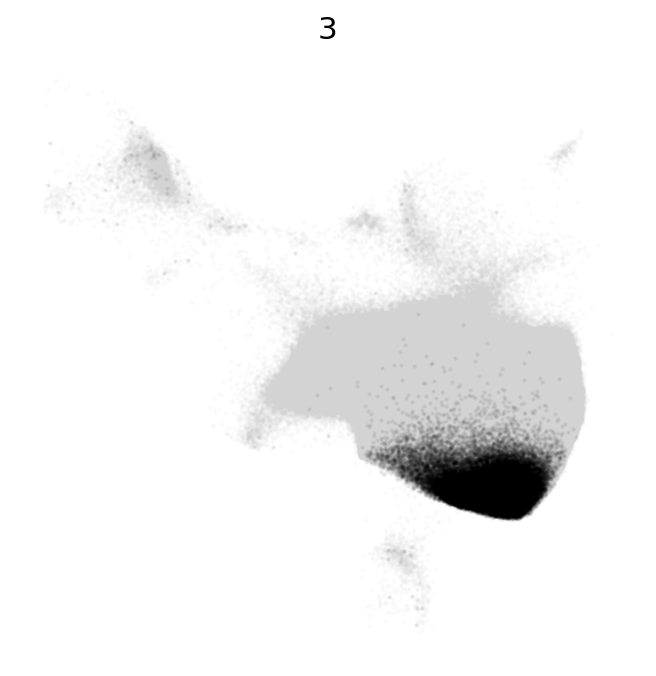

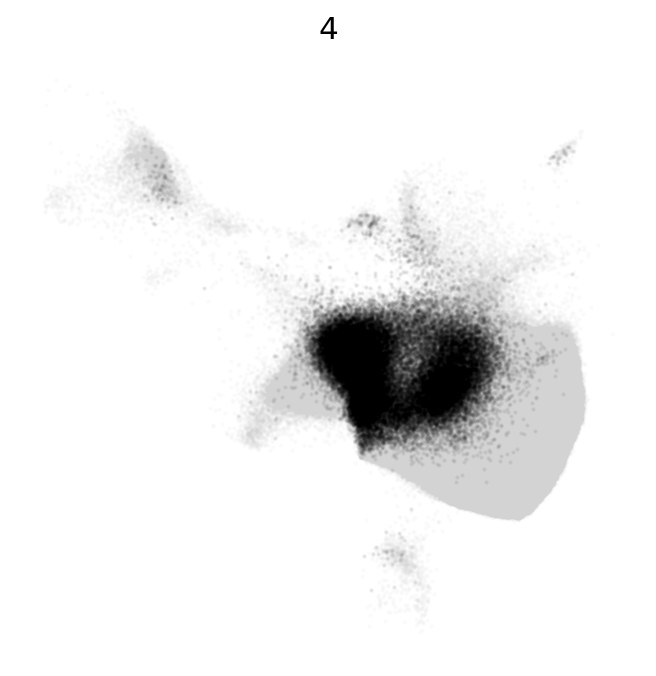

...

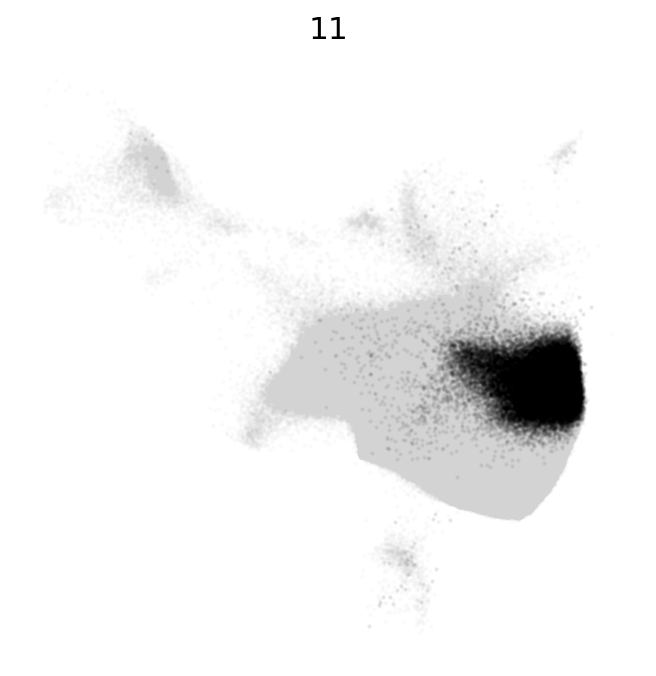

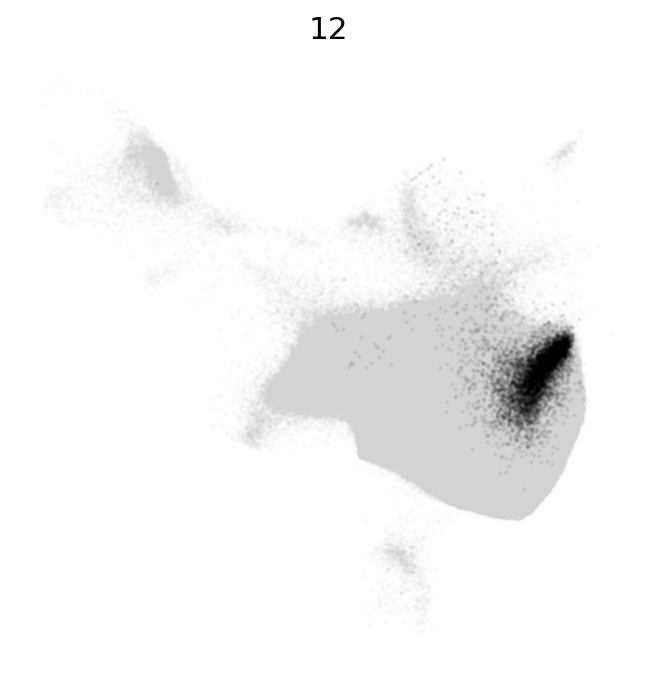

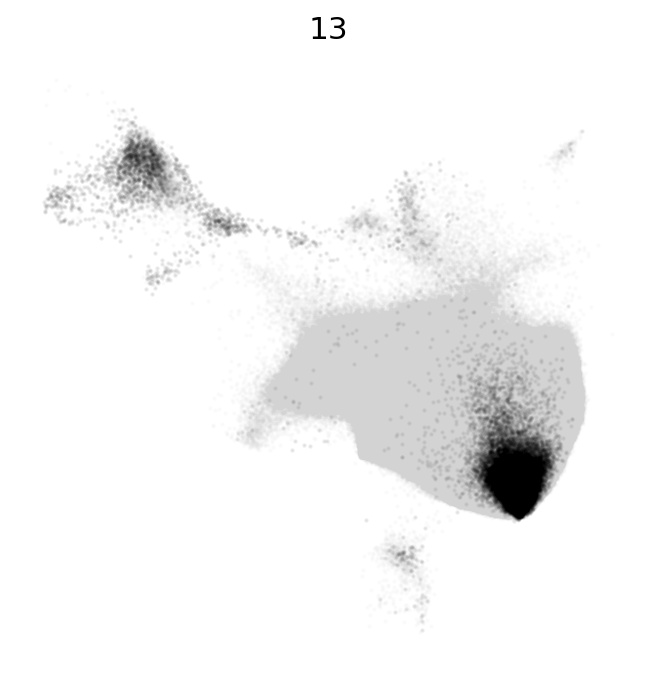

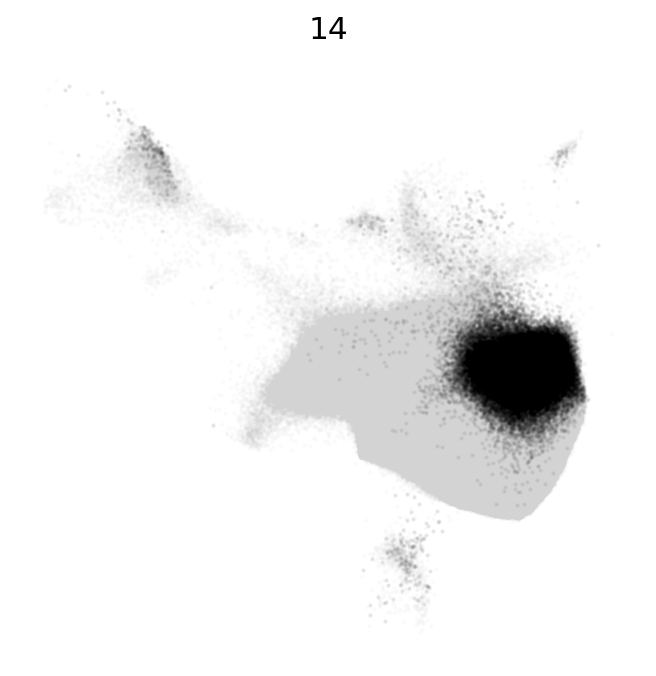

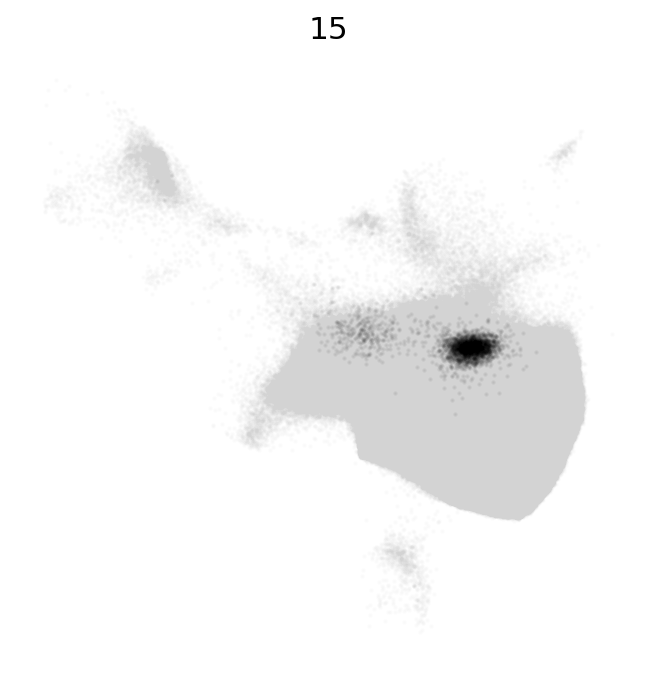

In [ ]:
plot_individual_category(adata_duct, "X_umap", "Leiden_cluster")

In [ ]:
cell_type = adata.obs['cell_type_1'].to_numpy().copy()

update_cells = adata_duct.obs_names[ismember(adata_duct.obs['Leiden_cluster'], [3,13,10])[1]]
cell_type[ismember(adata.obs_names, update_cells)[1]] = 'normalduct'

update_cells = adata_duct.obs_names[ismember(adata_duct.obs['Leiden_cluster'], [9,1])[1]]
cell_type[ismember(adata.obs_names, update_cells)[1]] = 'gastric_Ccn2'

update_cells = adata_duct.obs_names[ismember(adata_duct.obs['Leiden_cluster'], [5,4])[1]]
cell_type[ismember(adata.obs_names, update_cells)[1]] = 'progenitor1'

adata.obs['cell_type_1'] = cell_type.copy()


/data/lowe/reyesj3/miniconda3/envs/rapidsai/lib/python3.9/site-packages/anndata/_core/anndata.py:1301: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/data/lowe/reyesj3/miniconda3/envs/rapidsai/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


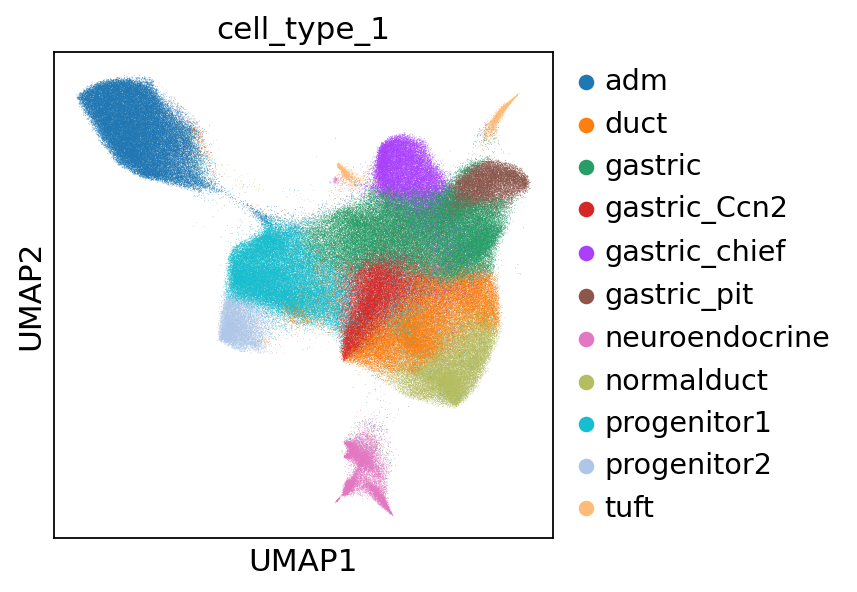

In [ ]:
sc.pl.umap(adata[random_indexes,:], color='cell_type_1')

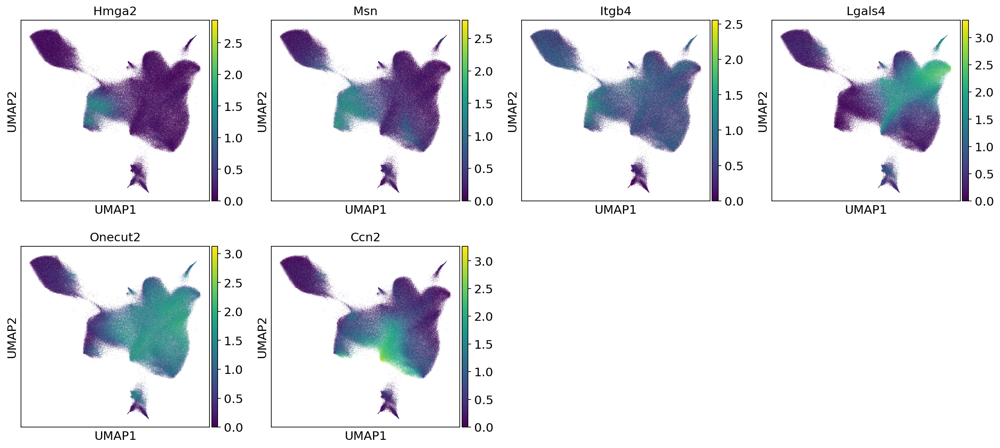

In [ ]:
sc.pl.umap(adata_sub, color=['Hmga2', 'Msn', 'Itgb4', 'Lgals4', 'Onecut2', 'Ccn2'])

In [ ]:
condition_map = {x:np.unique(adata.obs['condition'][adata.obs['slide_id'] == x])[0] for x in np.unique(adata.obs['slide_id'])}

In [ ]:
progenitor_freq = pd.DataFrame(pd.Series(ismember(adata.obs['cell_type_1'], ['progenitor1', 'progenitor2'])[1]).groupby(adata.obs['slide_id'].to_numpy()).agg('mean'))
progenitor_freq.columns = ['freq']
progenitor_freq['condition'] = np.array([condition_map[x] for x in progenitor_freq.index])
progenitor_freq = progenitor_freq.iloc[np.argsort(progenitor_freq['condition']),:]
progenitor_freq.groupby('condition').agg(lambda x: np.median(x))

,freq
condition,
K2_MRTX1133,0.016774
K2_ctrl,0.262057
K2_shp53,0.410898
K2_vehicle,0.153299
K2d1_ctrl,0.224325
K2d1_shp53,0.377085
K3_ctrl,0.092656
K3_shp53,0.222527
K4_ctrl,0.016971


### Re-embed progenitor-like cells to distinguish between progenitor and gastric-progenitor

In [ ]:
adata_progenitor = adata[ismember(adata.obs['cell_type_1'], ['progenitor1', 'progenitor2', 'gastricprogenitor'])[1],:].copy()

In [ ]:
adata_progenitor = quick_embed(adata_progenitor)

   Excluded 0 cells with less than 25 counts
   Normalizing data
   Log transform with pseudocount 1
   Running PCA


/data/lowe/reyesj3/miniconda3/envs/rapidsai/lib/python3.9/site-packages/cugraph/structure/symmetrize.py:93: FutureWarning: Multi is deprecated and the removal of multi edges will no longer be supported from 'symmetrize'. Multi edges will be removed upon creation of graph instance.
  warnings.warn(


   Getting Leiden clusters


In [ ]:
G, edges = get_cugraph_from_array(adata_progenitor.obsm['indices'])
jaccard_G = get_jaccard(G)

/data/lowe/reyesj3/miniconda3/envs/rapidsai/lib/python3.9/site-packages/cugraph/structure/symmetrize.py:93: FutureWarning: Multi is deprecated and the removal of multi edges will no longer be supported from 'symmetrize'. Multi edges will be removed upon creation of graph instance.
  warnings.warn(


   Building Jaccard matrix


/data/lowe/reyesj3/miniconda3/envs/rapidsai/lib/python3.9/site-packages/cugraph/structure/symmetrize.py:93: FutureWarning: Multi is deprecated and the removal of multi edges will no longer be supported from 'symmetrize'. Multi edges will be removed upon creation of graph instance.
  warnings.warn(


In [ ]:
clusters = louvain_gpu(jaccard_G, resolution = 1)
adata_progenitor.obs['PhenoGraph_cluster_higres'] = pd.Categorical(clusters)

   Finding clusters using louvain


In [ ]:
clusters = louvain_gpu(jaccard_G, resolution = 0.75)
adata_progenitor.obs['PhenoGraph_cluster_medres'] = pd.Categorical(clusters)

   Finding clusters using louvain


In [ ]:
clusters = louvain_gpu(jaccard_G, resolution = 0.41)
adata_progenitor.obs['PhenoGraph_cluster_lowres'] = pd.Categorical(clusters)

   Finding clusters using louvain


/data/lowe/reyesj3/miniconda3/envs/rapidsai/lib/python3.9/site-packages/scanpy/plotting/_dotplot.py:747: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


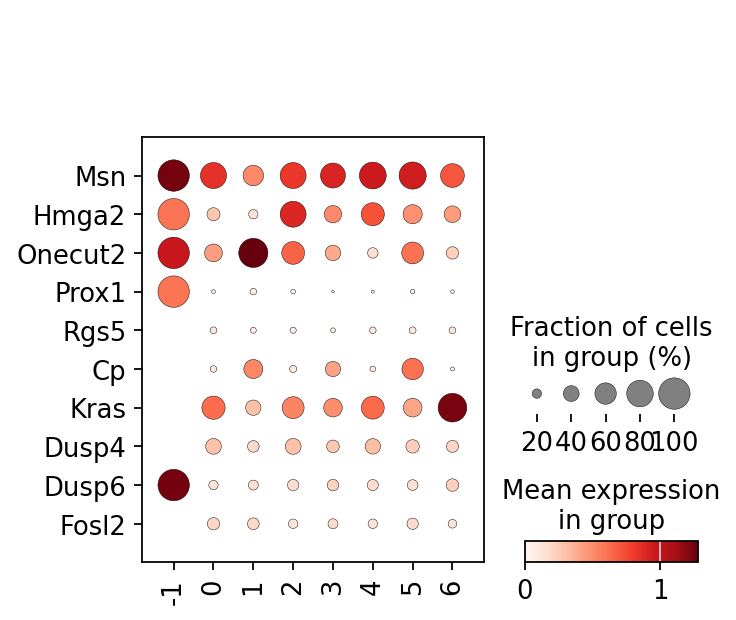

In [ ]:
sc.pl.dotplot(adata_progenitor, groupby = 'PhenoGraph_cluster_lowres', var_names = ['Msn', 'Hmga2', 'Onecut2', 'Prox1', 'Rgs5', 'Cp', 'Kras', 'Dusp4', 'Dusp6', 'Fosl2'], swap_axes=True)


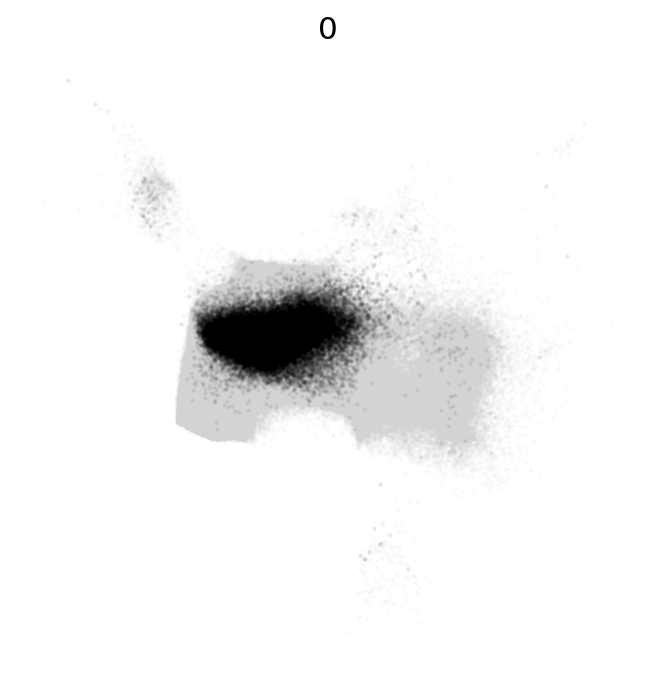

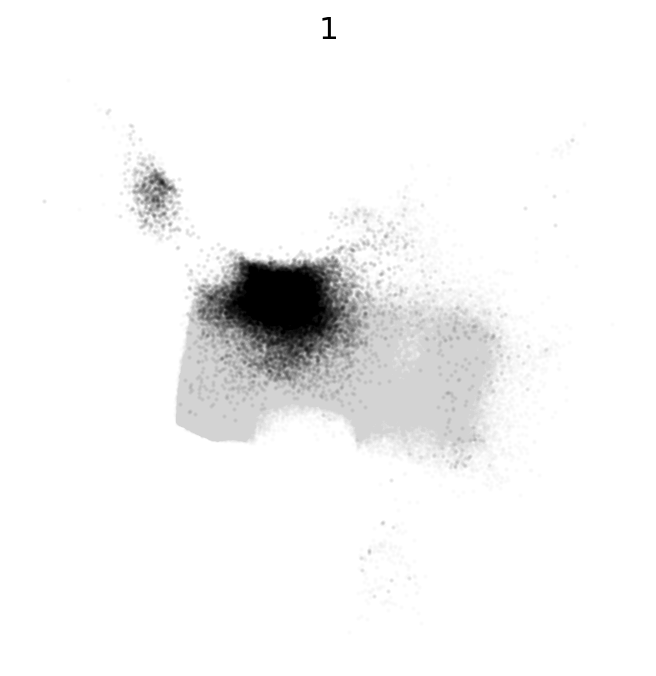

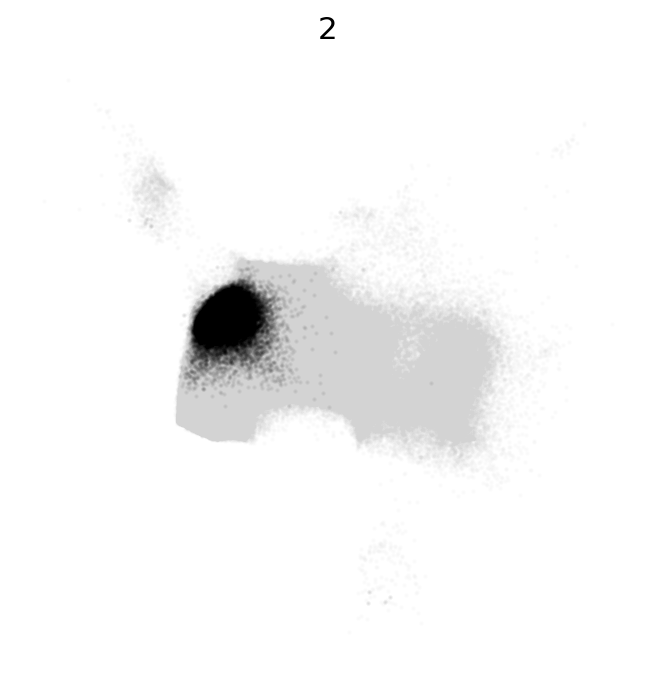

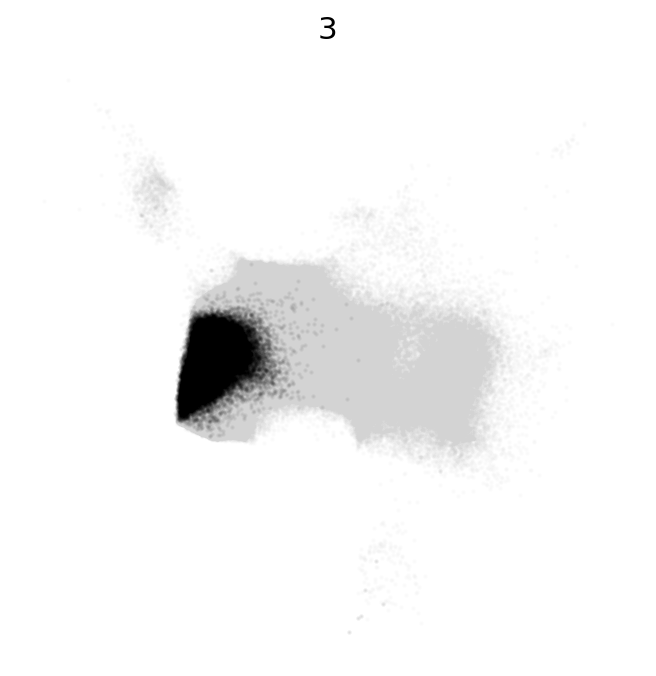

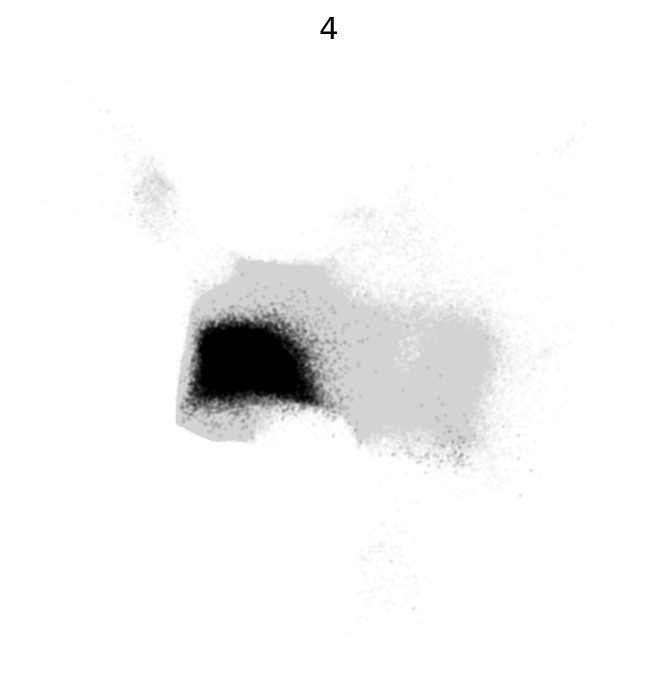

...

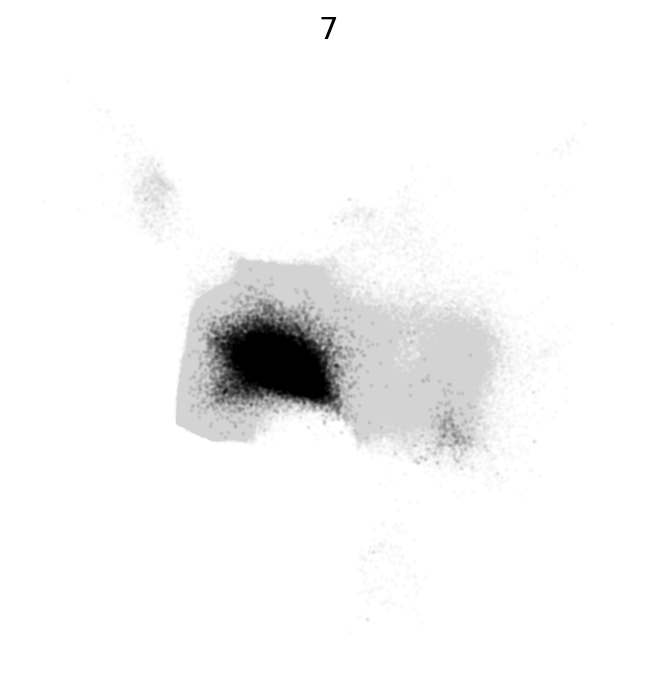

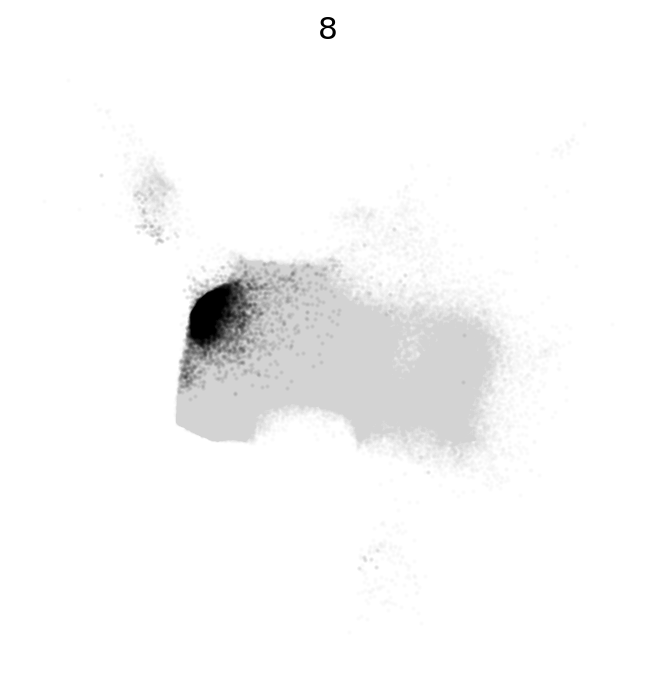

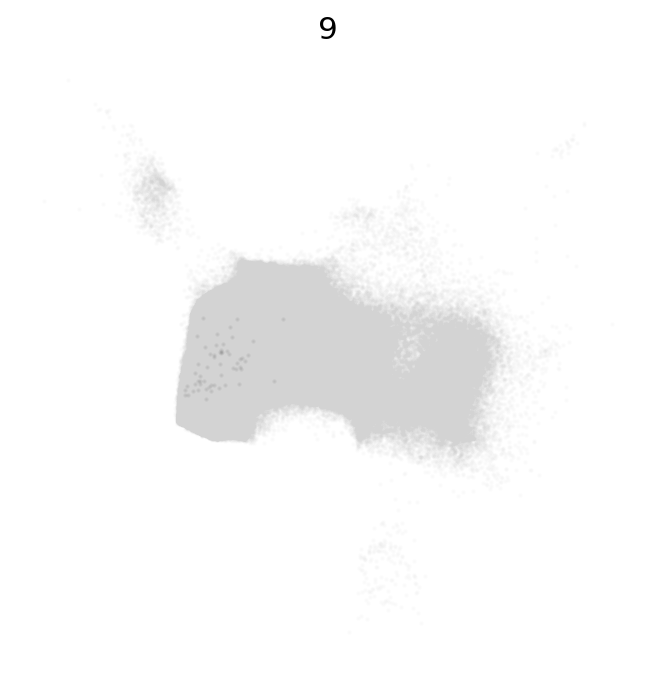

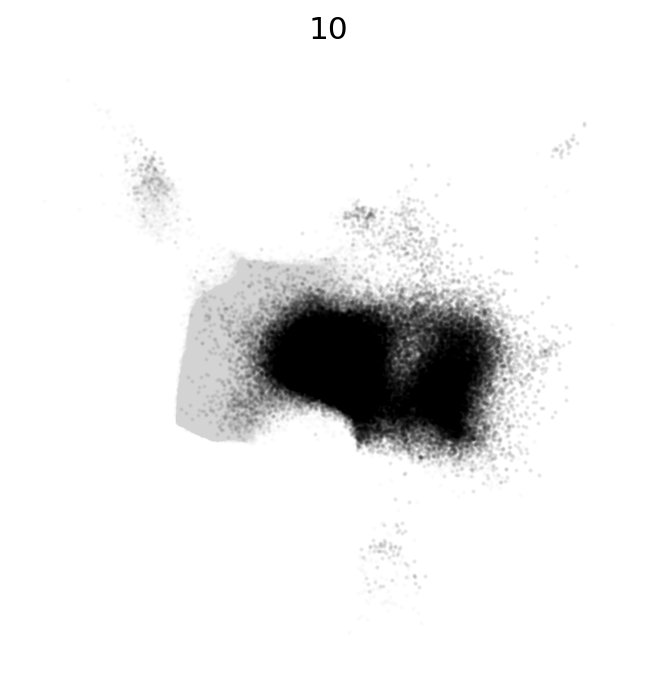

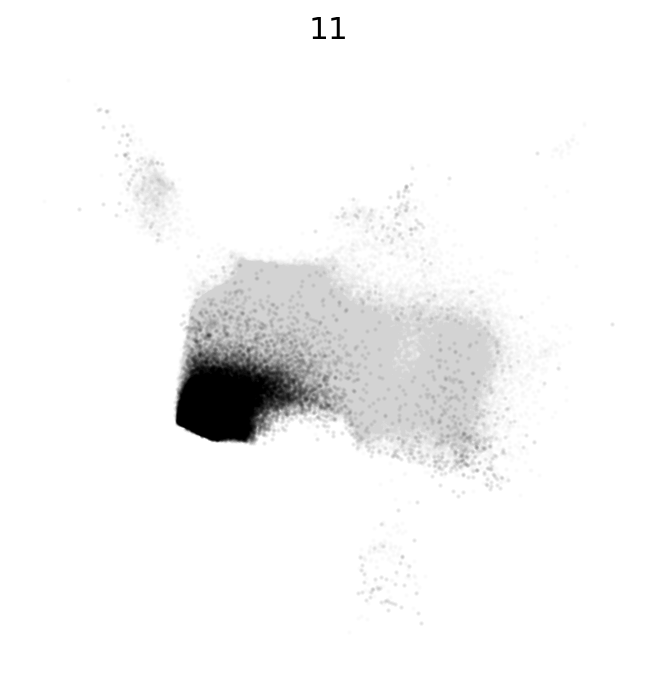

In [ ]:
plot_individual_category(adata_progenitor, "X_umap", "Leiden_cluster")

In [ ]:
cell_type = adata.obs['cell_type_1'].to_numpy().copy()

update_cells = adata_progenitor.obs_names[ismember(adata_progenitor.obs['Leiden_cluster'], [10])[1]]
cell_type[ismember(adata.obs_names, update_cells)[1]] = 'gastricprogenitor'

adata.obs['cell_type_1'] = cell_type.copy()


/data/lowe/reyesj3/miniconda3/envs/rapidsai/lib/python3.9/site-packages/anndata/_core/anndata.py:1301: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/data/lowe/reyesj3/miniconda3/envs/rapidsai/lib/python3.9/site-packages/anndata/_core/anndata.py:1301: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/data/lowe/reyesj3/miniconda3/envs/rapidsai/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


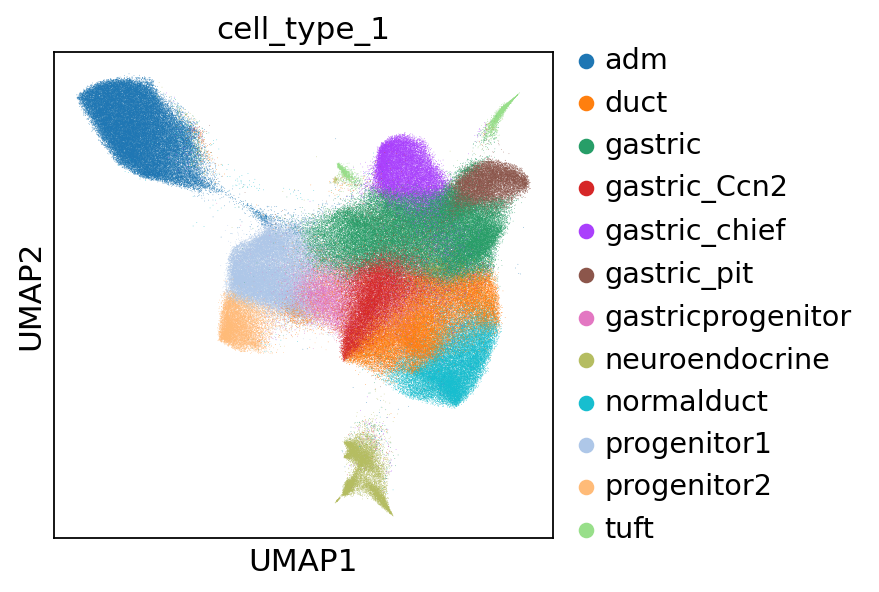

In [ ]:
sc.pl.umap(adata[random_indexes,:], color='cell_type_1')

### Write results

Update subset-specific obs file

In [ ]:
dataset_prefix = "adata_" + selected_tier + "_SUBSET_%s_LAYER_%s_LOG_%s" % (selected_subset, selected_layer, use_log)
file_prefix = "%s_EXPLAINEDVAR_%d_KNN_%s" % (dataset_prefix, int(explained_var * 100), "%d")
obs_file = os.path.join(obs_output_path,file_prefix % (cluster_n_neighbors) + "__obs.h5ad" )
updated_file = os.path.join(updated_obs_output_path,file_prefix % (cluster_n_neighbors) + "__obs.h5ad" )
updated_file

In [ ]:
adata_result = sc.read_h5ad(obs_file)
adata_result.obs_names = adata.obs_names.copy()
adata_result.obs['cell_type_0'] = adata.obs['cell_type_0'].copy()
adata_result.obs['cell_type_1'] = adata.obs['cell_type_1'].copy()
adata_result.obs['PhenoGraph_cluster'] = adata.obs['PhenoGraph_cluster_medres'].copy()

In [ ]:
sc.write(updated_file, adata = adata_result)

Update obs file for entire dataset

In [ ]:
cell_type_master = obs_master.obs['cell_type_1'].to_numpy()
matched_indices = ismember(adata.obs_names, obs_master.obs_names)[0]
print(np.sum(np.equal(obs_master[matched_indices].obs['cell_type_1'].to_numpy(), adata.obs['cell_type_1'].to_numpy())) / adata.n_obs)

cell_type_master[matched_indices] = adata.obs['cell_type_1'].to_numpy()
obs_master.obs['cell_type_1'] = cell_type_master.copy()
print(np.sum(np.equal(obs_master[matched_indices].obs['cell_type_1'].to_numpy(), adata.obs['cell_type_1'].to_numpy())) / adata.n_obs)

0.9608131564511894
1.0


In [ ]:
adata_master = sc.read_h5ad(os.path.join(output_path, "adata_base/adata_tier0_SUBSET_all_LAYER_raw_in_nucleus_LOG_False.h5ad"))
umap = pd.read_csv(os.path.join(output_path, "umap/adata_tier0_SUBSET_all_LAYER_raw_in_nucleus_LOG_False_EXPLAINEDVAR_75_KNN_10_MINDIST_5__umap.csv.gz"), index_col = 0)
adata_master.obsm['X_umap'] = umap.to_numpy()
adata_master.obs = obs_master.obs.copy()

/data/lowe/reyesj3/miniconda3/envs/rapidsai/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


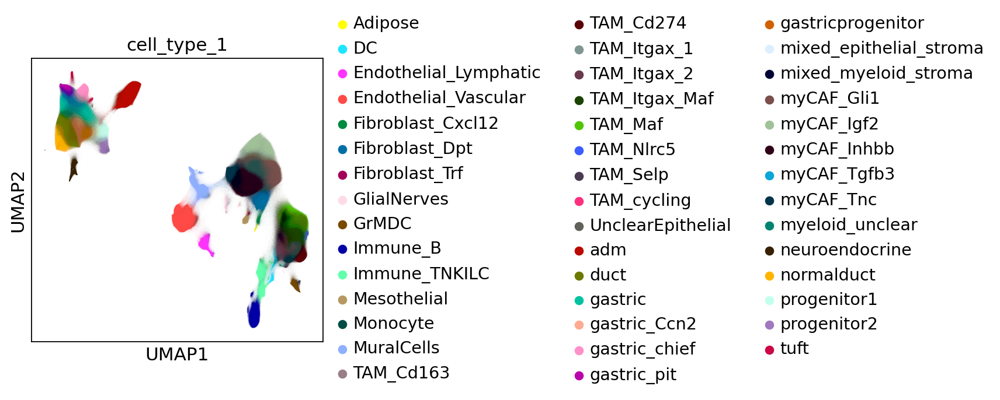

In [ ]:
sc.pl.umap(adata_master, color='cell_type_1')

In [ ]:
sc.write(updated_master_obs_file, adata = obs_master)